In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import glob
from cartopy.util import add_cyclic_point
import cartopy.mpl.ticker as cticker
import scipy.stats as stats

In [2]:
# Load the dataset for 2004-2007
files = sorted(glob.glob("/home/salmadan/Desktop/groups/ESS3/Sara/daily/mean/DUST_PM_AOD_200[4-7]*_tot.nc"))
ds = xr.open_mfdataset(files, combine='by_coords', chunks={'time': 10})

# Convert daily data to monthly averages 
ds_monthly = ds.resample(time='ME').mean()

In [3]:
# Calculate PM2.5 anomaly (mean over 2004-2007)
ds_monthly_climatology = ds['pm25'].groupby('time.month').mean('time')
pm25_anomaly = ds['pm25'].groupby('time.month') - ds_monthly_climatology

In [4]:
print(pm25_anomaly)  # Check the structure and dimensions

<xarray.DataArray 'pm25' (time: 1461, lat: 1800, lon: 3600)> Size: 38GB
dask.array<sub, shape=(1461, 1800, 3600), dtype=float32, chunksize=(1, 900, 1800), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 12kB 2004-01-01 2004-01-02 ... 2007-12-31
  * lon      (lon) float32 14kB -179.9 -179.9 -179.8 ... 179.8 179.9 179.9
  * lat      (lat) float32 7kB -89.95 -89.85 -89.75 -89.65 ... 89.75 89.85 89.95
    month    (time) int64 12kB 1 1 1 1 1 1 1 1 1 ... 12 12 12 12 12 12 12 12 12


In [5]:
print(pm25_anomaly['time'])

<xarray.DataArray 'time' (time: 1461)> Size: 12kB
array(['2004-01-01T00:00:00.000000000', '2004-01-02T00:00:00.000000000',
       '2004-01-03T00:00:00.000000000', ..., '2007-12-29T00:00:00.000000000',
       '2007-12-30T00:00:00.000000000', '2007-12-31T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 12kB 2004-01-01 2004-01-02 ... 2007-12-31
    month    (time) int64 12kB 1 1 1 1 1 1 1 1 1 ... 12 12 12 12 12 12 12 12 12
Attributes:
    long_name:  time


In [6]:
print(pm25_anomaly.sel(time="2004-01").values)

[[[-0.18057156 -0.18056822 -0.18056452 ... -0.18057656 -0.18057334
   -0.18056953]
  [-0.18696332 -0.18695307 -0.1869427  ... -0.18699014 -0.1869793
   -0.18696856]
  [-0.1933552  -0.19333816 -0.19332087 ... -0.19340384 -0.19338548
   -0.1933676 ]
  ...
  [-0.9650247  -0.96516275 -0.96530104 ... -0.96405506 -0.9643631
   -0.96467113]
  [-0.9715769  -0.97166014 -0.97174287 ... -0.9709425  -0.9711273
   -0.97131205]
  [-0.97812915 -0.9781568  -0.97818446 ... -0.9778304  -0.9778924
   -0.9779537 ]]

 [[-0.10313487 -0.10313249 -0.10312986 ... -0.10315037 -0.10314655
   -0.10314202]
  [-0.10589314 -0.10588598 -0.10587859 ... -0.10593224 -0.1059196
   -0.1059072 ]
  [-0.1086514  -0.10863948 -0.10862756 ... -0.1087141  -0.10869288
   -0.10867214]
  ...
  [-0.85227156 -0.8524296  -0.85258746 ... -0.85126925 -0.85161996
   -0.8519707 ]
  [-0.8589747  -0.8590698  -0.8591645  ... -0.8583541  -0.8585646
   -0.85877514]
  [-0.8656776  -0.86570954 -0.865741   ... -0.8654399  -0.8655102
   -0.8655801

In [7]:
print(ds_monthly_climatology)

<xarray.DataArray 'pm25' (month: 12, lat: 1800, lon: 3600)> Size: 311MB
dask.array<stack, shape=(12, 1800, 3600), dtype=float32, chunksize=(1, 900, 1800), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float32 14kB -179.9 -179.9 -179.8 ... 179.8 179.9 179.9
  * lat      (lat) float32 7kB -89.95 -89.85 -89.75 -89.65 ... 89.75 89.85 89.95
  * month    (month) int64 96B 1 2 3 4 5 6 7 8 9 10 11 12
Attributes:
    long_name:  Total PM25 concentrations
    units:      ug m-3
    var_desc:   Total Surface Mass Concentration - PM 25


In [8]:
test_data = pm25_anomaly.sel(time="2004-01")
print(test_data)

<xarray.DataArray 'pm25' (time: 31, lat: 1800, lon: 3600)> Size: 804MB
dask.array<getitem, shape=(31, 1800, 3600), dtype=float32, chunksize=(1, 900, 1800), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 248B 2004-01-01 2004-01-02 ... 2004-01-31
  * lon      (lon) float32 14kB -179.9 -179.9 -179.8 ... 179.8 179.9 179.9
  * lat      (lat) float32 7kB -89.95 -89.85 -89.75 -89.65 ... 89.75 89.85 89.95
    month    (time) int64 248B 1 1 1 1 1 1 1 1 1 1 1 1 ... 1 1 1 1 1 1 1 1 1 1 1


In [9]:
# Define color range for PM2.5 concentrations based on 5th and 95th percentiles
vmin, vmax = np.percentile(ds_monthly['pm25'].values, [5, 95])

# Define month names for labeling
months = [
    "January", "February", "March", "April", "May", "June", 
    "July", "August", "September", "October", "November", "December"
]


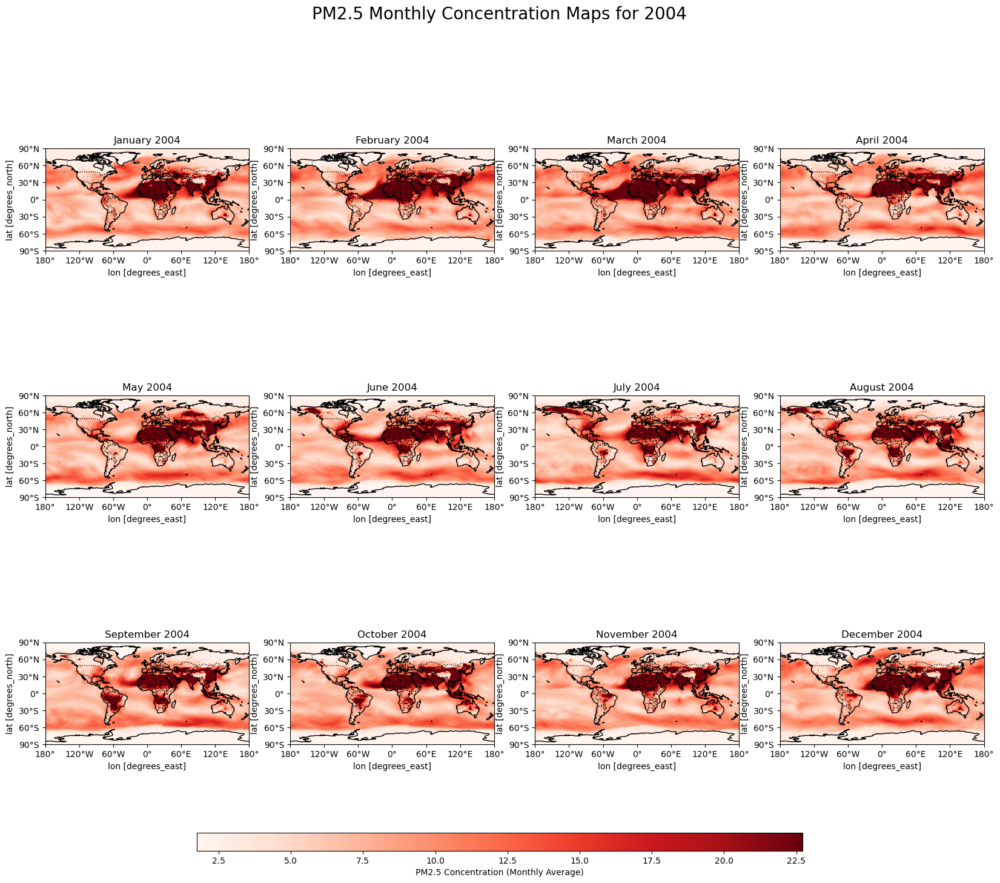

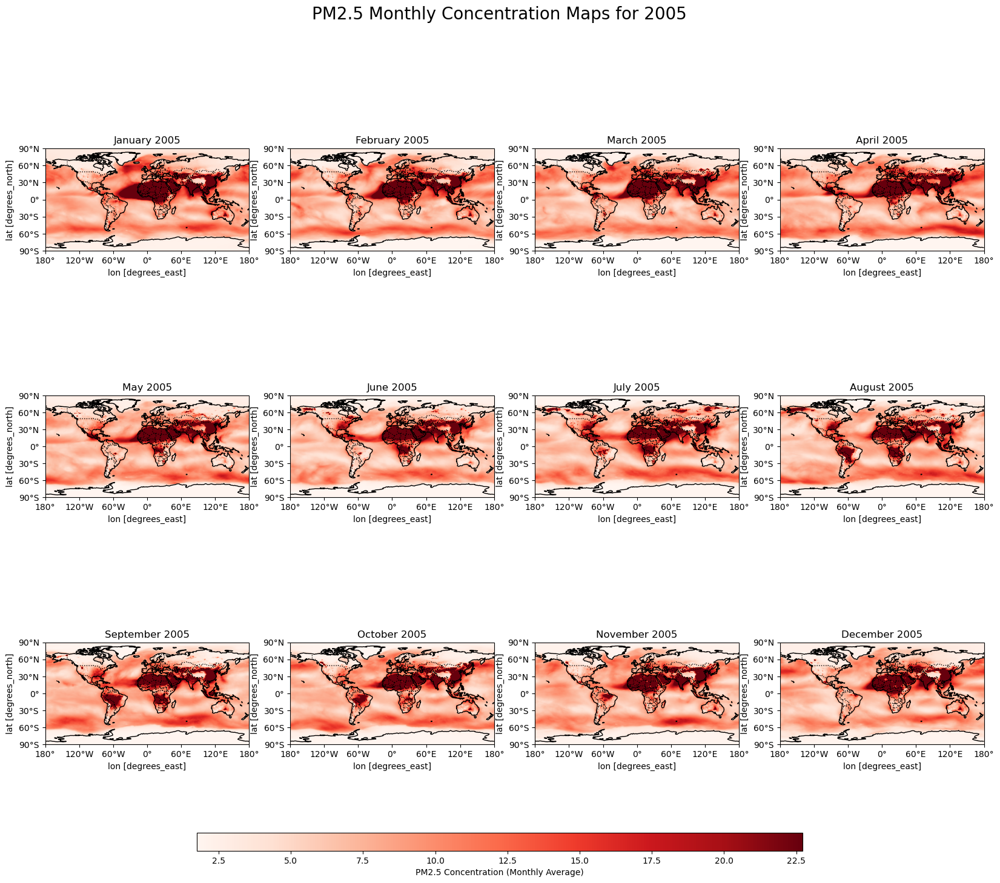

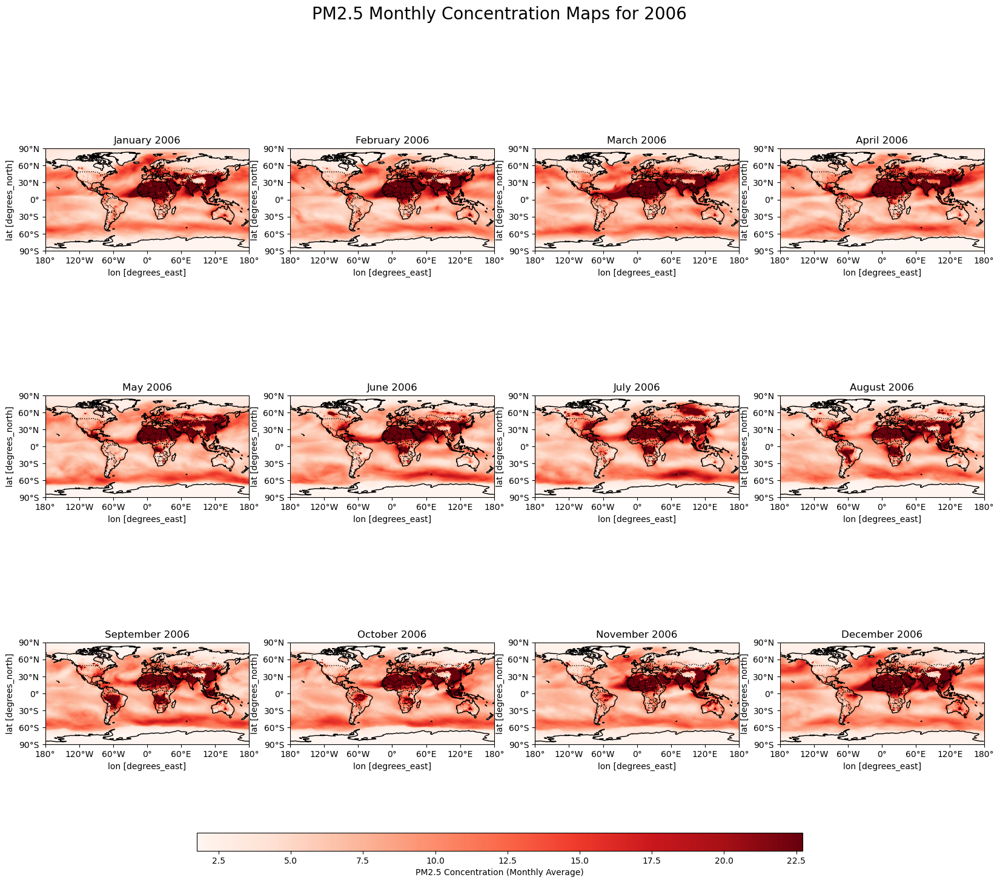

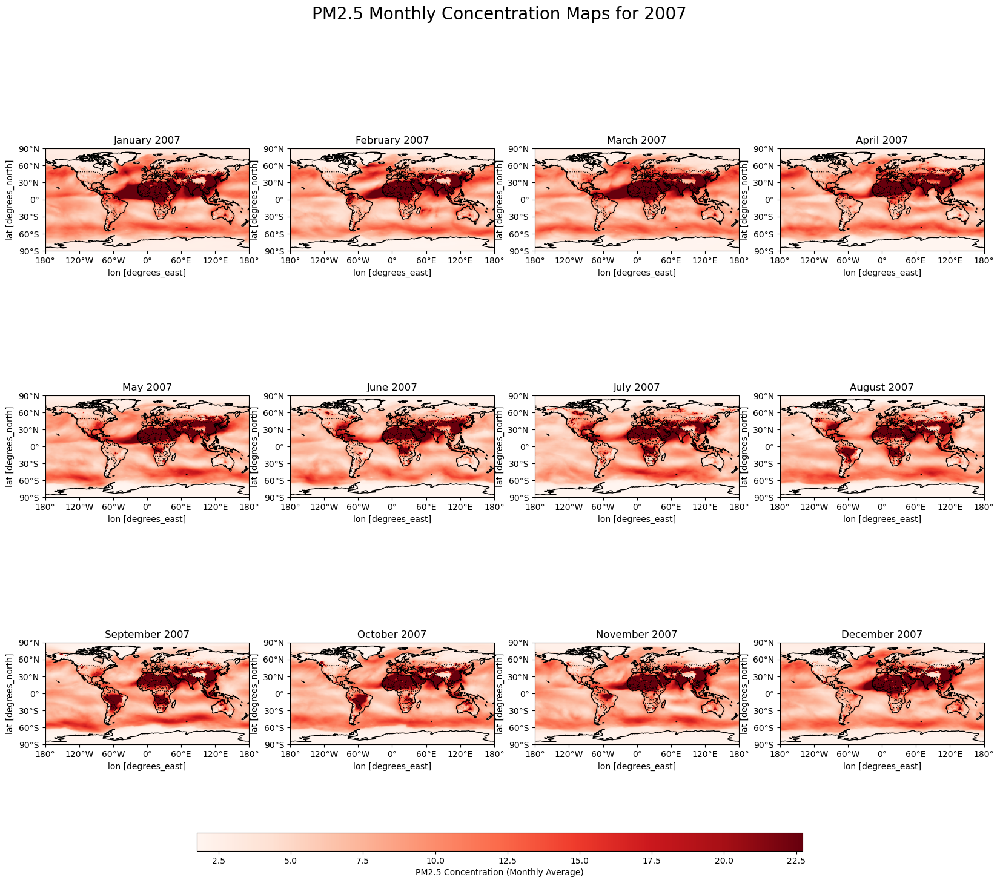

In [10]:
# Loop over each year from 2004 to 2007
for year in range(2004, 2008):
    # Set up the figure with 3 rows and 4 columns for 12 months
    fig, axs = plt.subplots(3, 4, figsize=(20, 15), subplot_kw={'projection': ccrs.PlateCarree()})
    fig.suptitle(f"PM2.5 Monthly Concentration Maps for {year}", fontsize=20)

    # Flatten the axs array for easy indexing
    axs = axs.flatten()

    # Loop through each month and plot the data for the current year
    for month in range(1, 13):
        ax = axs[month - 1]
        
        # Select the data for the current month and year
        month_data = ds_monthly.sel(time=f"{year}-{month:02d}")
        
        # Plot the data for the month
        pm25_plot = month_data['pm25'].plot(
            ax=ax, transform=ccrs.PlateCarree(), cmap='Reds', vmin=vmin, vmax=vmax, add_colorbar=False
        )

        # Add map features
        ax.coastlines()
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.set_title(f"{months[month - 1]} {year}", fontsize=12)  # Display month and year as title

        # Longitude labels
        ax.set_xticks(np.arange(-180, 181, 60), crs=ccrs.PlateCarree())
        lon_formatter = cticker.LongitudeFormatter()
        ax.xaxis.set_major_formatter(lon_formatter)

        # Latitude labels
        ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
        lat_formatter = cticker.LatitudeFormatter()
        ax.yaxis.set_major_formatter(lat_formatter)

    # Add a colorbar below all subplots
    cbar_ax = fig.add_axes([0.25, 0.05, 0.5, 0.02])  # Adjust position as needed
    fig.colorbar(pm25_plot, cax=cbar_ax, orientation='horizontal', label='PM2.5 Concentration (Monthly Average)')
    
    plt.show()  # Show the plot for each year separately

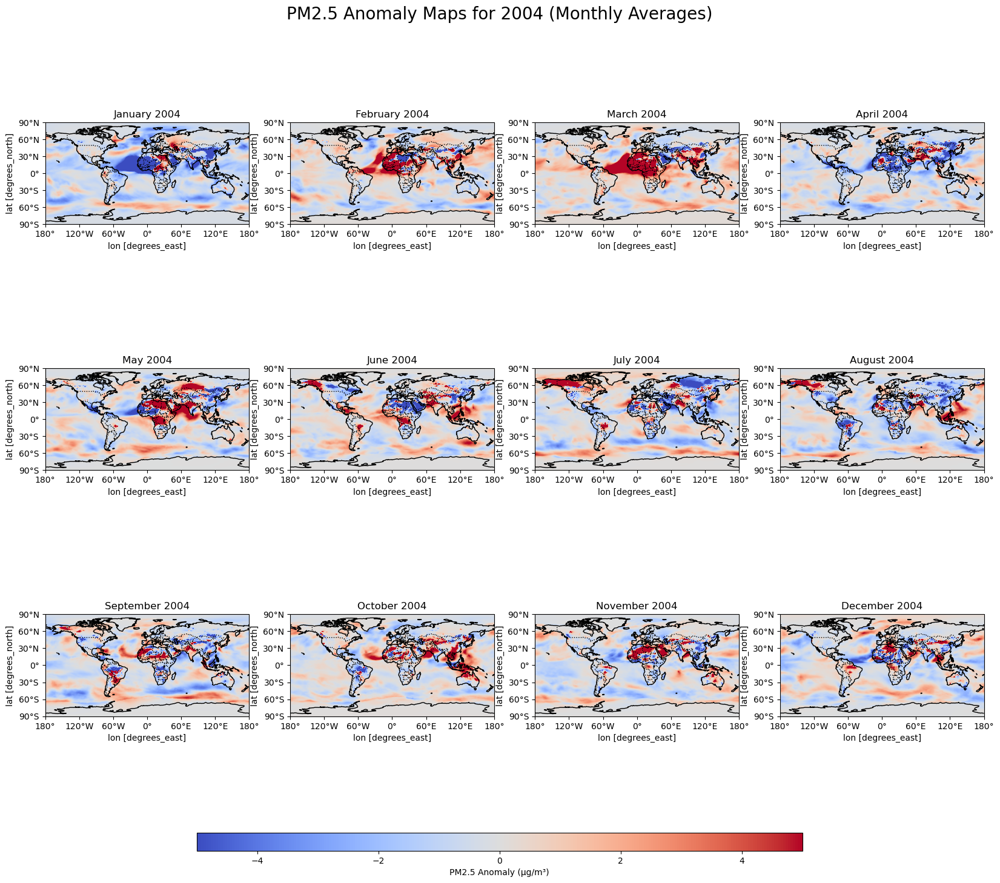

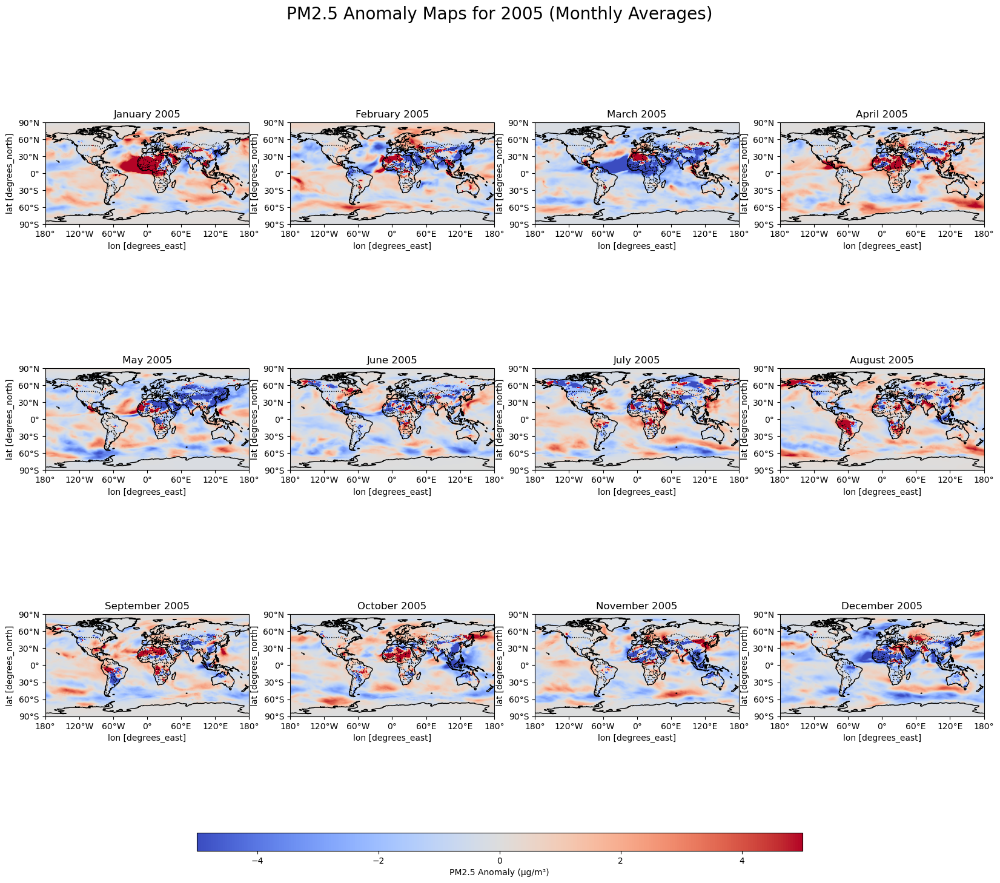

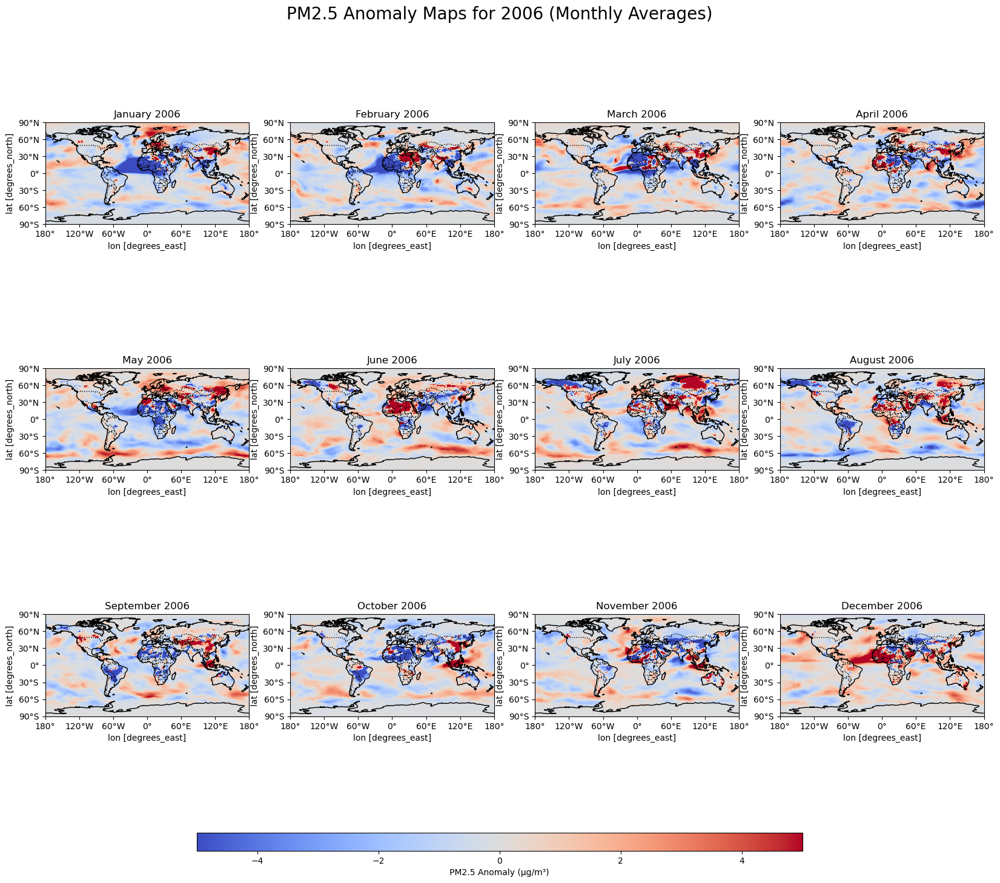

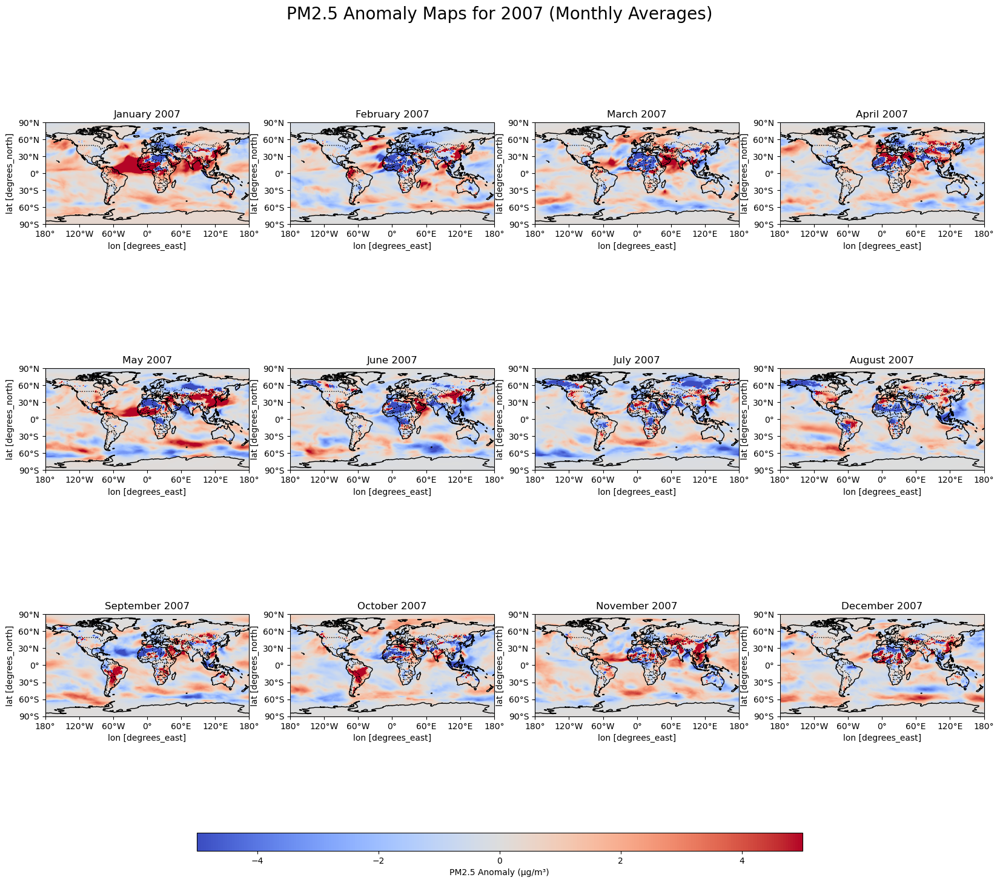

In [12]:
# Define the month names for labeling
months = [
    "January", "February", "March", "April", "May", "June", 
    "July", "August", "September", "October", "November", "December"
]

# Define color limits for anomaly plots
vmin, vmax = -5, 5

# Loop over each year from 2004 to 2007
for year in range(2004, 2008):
    # Set up the figure with 3 rows and 4 columns for 12 months
    fig, axs = plt.subplots(3, 4, figsize=(20, 15), subplot_kw={'projection': ccrs.PlateCarree()})
    fig.suptitle(f"PM2.5 Anomaly Maps for {year} (Monthly Averages)", fontsize=20)

    # Flatten the axs array for easy indexing
    axs = axs.flatten()

    # Initialize anomaly_plot outside the loop
    anomaly_plot = None

    # Loop through each month and plot the data for the current year
    for month in range(1, 13):
        ax = axs[month - 1]
        
        # Select the data for the current month and year
        try:
            # Take the mean over the time dimension to get 2D data (lat, lon)
            month_data = pm25_anomaly.sel(time=f"{year}-{month:02d}").mean(dim="time")
            # Ensure month_data is a DataArray with 2D dimensions before plotting
            if isinstance(month_data, xr.DataArray) and month_data.ndim == 2:
                anomaly_plot = month_data.plot(
                    ax=ax, cmap='coolwarm', transform=ccrs.PlateCarree(),
                    vmin=vmin, vmax=vmax, add_colorbar=False
                )
            else:
                # If data is invalid, skip the plot
                ax.set_axis_off()
        except KeyError:
            # If data for a specific month-year combination is missing, skip plotting for that cell
            ax.set_axis_off()


        # Longitude labels
        ax.set_xticks(np.arange(-180, 181, 60), crs=ccrs.PlateCarree())
        lon_formatter = cticker.LongitudeFormatter()
        ax.xaxis.set_major_formatter(lon_formatter)

        # Latitude labels
        ax.set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
        lat_formatter = cticker.LatitudeFormatter()
        ax.yaxis.set_major_formatter(lat_formatter)
            
            
        # Add map features and title
        ax.coastlines()
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.set_title(f"{months[month - 1]} {year}", fontsize=12)  # Display month and year as title

    # Add a single colorbar below all subplots if anomaly_plot is defined
    if anomaly_plot is not None:
        cbar_ax = fig.add_axes([0.25, 0.05, 0.5, 0.02])  # Adjust position as needed
        fig.colorbar(anomaly_plot, cax=cbar_ax, orientation='horizontal', label='PM2.5 Anomaly (µg/m³)')

    # Avoid using tight_layout; adjust subplots manually
    plt.subplots_adjust(top=0.9, bottom=0.15, hspace=0.3, wspace=0.2)
    plt.show()


<p style="font-size:30px;">NASA Global Average Land/Ocean Temperature:</p>

In [9]:
import pandas as pd

# Load the data from CSV
file_path = "/home/salmadan/nasa comb.csv"
index_df = pd.read_csv(file_path)

# Convert the 'Date' column to datetime format
index_df['Date'] = pd.to_datetime(index_df['Date'], errors='coerce')

# Filter out invalid data
index_df = index_df[index_df['NASA Global Average Land/Ocean Temperature Anomalies'] != -9999]


In [10]:
# Set thresholds for positive, negative, and neutral categories
positive_threshold = 0.5
negative_threshold = -0.5

# Create separate DataFrames for each category
positive = index_df['NASA Global Average Land/Ocean Temperature Anomalies'].where(index_df['NASA Global Average Land/Ocean Temperature Anomalies'] >= positive_threshold)
negative = index_df['NASA Global Average Land/Ocean Temperature Anomalies'].where(index_df['NASA Global Average Land/Ocean Temperature Anomalies'] <= negative_threshold)
neutral = index_df['NASA Global Average Land/Ocean Temperature Anomalies'].where((index_df['NASA Global Average Land/Ocean Temperature Anomalies'] < positive_threshold) & (index_df['NASA Global Average Land/Ocean Temperature Anomalies'] > negative_threshold))

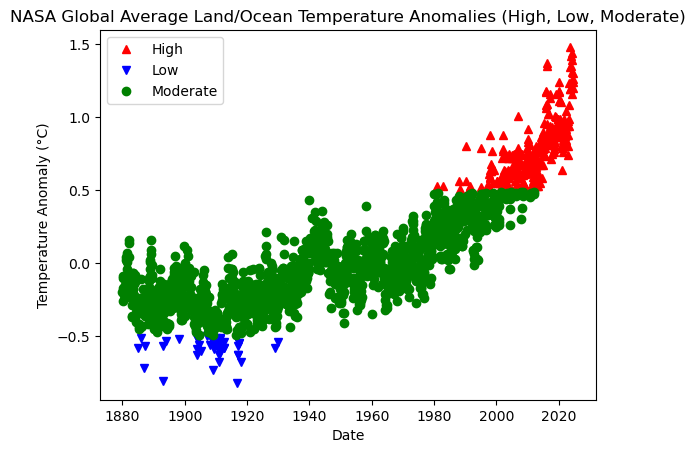

In [15]:
# Plot each category with a label for the legend
plt.plot(index_df['Date'], positive, 'r^', label='High')
plt.plot(index_df['Date'], negative, 'bv', label='Low')
plt.plot(index_df['Date'], neutral, 'go', label='Moderate')

# Add the legend
plt.legend()

# Add labels and title
plt.xlabel('Date')
plt.ylabel('Temperature Anomaly (°C)')
plt.title('NASA Global Average Land/Ocean Temperature Anomalies (High, Low, Moderate)')

# Show the plot
plt.show()


In [11]:
# Filter data for the years 2004-2007
filtered_df = index_df[(index_df["Date"].dt.year >= 2004) & (index_df["Date"].dt.year <= 2007)]

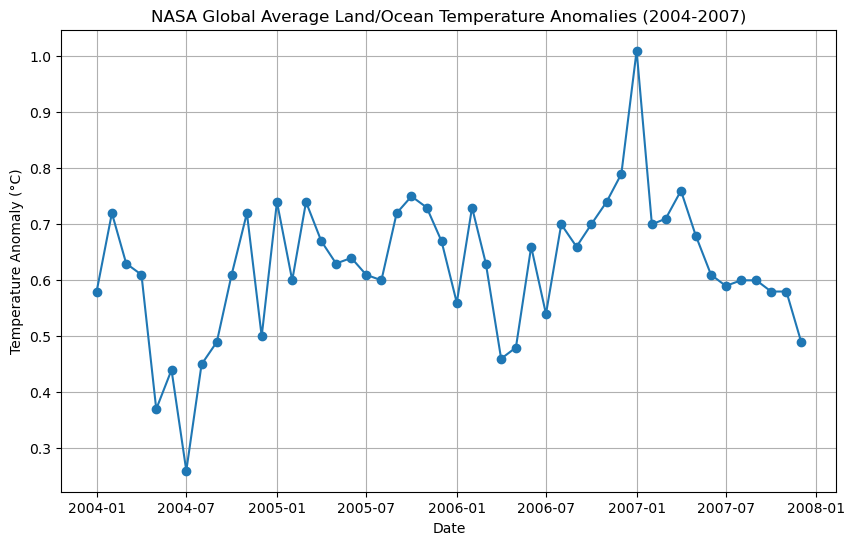

In [17]:
# Plotting the data
plt.figure(figsize=(10, 6))
plt.plot(filtered_df["Date"], filtered_df["NASA Global Average Land/Ocean Temperature Anomalies"], marker='o')
plt.title("NASA Global Average Land/Ocean Temperature Anomalies (2004-2007)")
plt.xlabel("Date")
plt.ylabel("Temperature Anomaly (°C)")
plt.grid(True)
plt.show()

In [12]:
#calculations:
# Set thresholds for positive, negative, and neutral categories
positive_threshold2 = 0.7
negative_threshold2 = 0.5

# Create separate DataFrames for each category
Positive2 = filtered_df['NASA Global Average Land/Ocean Temperature Anomalies'].where(filtered_df['NASA Global Average Land/Ocean Temperature Anomalies'] >= positive_threshold2)

Negative2 = filtered_df['NASA Global Average Land/Ocean Temperature Anomalies'].where(filtered_df['NASA Global Average Land/Ocean Temperature Anomalies'] <= negative_threshold2)

Neutral2 = filtered_df['NASA Global Average Land/Ocean Temperature Anomalies'].where((filtered_df['NASA Global Average Land/Ocean Temperature Anomalies'] < positive_threshold2) & (filtered_df['NASA Global Average Land/Ocean Temperature Anomalies'] > negative_threshold2))

In [13]:
# Identify dates for each category based on temperature anomaly thresholds
positive_periods = filtered_df['Date'][filtered_df['NASA Global Average Land/Ocean Temperature Anomalies'] >= positive_threshold2].to_numpy()
negative_periods = filtered_df['Date'][filtered_df['NASA Global Average Land/Ocean Temperature Anomalies'] <= negative_threshold2].to_numpy()
neutral_periods = filtered_df['Date'][(filtered_df['NASA Global Average Land/Ocean Temperature Anomalies'] < positive_threshold2) & 
                                      (filtered_df['NASA Global Average Land/Ocean Temperature Anomalies'] > negative_threshold2)].to_numpy()

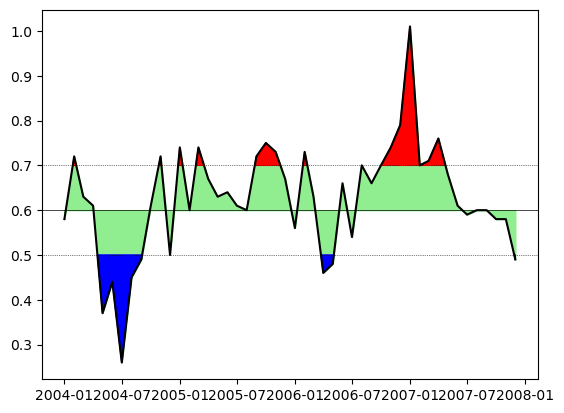

In [20]:
#print(Positive,Negative,Neutral)
plt.plot(filtered_df['Date'],filtered_df['NASA Global Average Land/Ocean Temperature Anomalies'],'k')
plt.fill_between(filtered_df['Date'].values,filtered_df['NASA Global Average Land/Ocean Temperature Anomalies'],0.6,color='lightgreen')
plt.fill_between(filtered_df['Date'].values,filtered_df['NASA Global Average Land/Ocean Temperature Anomalies'],
                 y2=positive_threshold2, where=filtered_df['NASA Global Average Land/Ocean Temperature Anomalies']>=positive_threshold2, interpolate=True,color='red')
plt.fill_between(filtered_df['Date'].values,filtered_df['NASA Global Average Land/Ocean Temperature Anomalies'],
                 y2=negative_threshold2, where=filtered_df['NASA Global Average Land/Ocean Temperature Anomalies']<=negative_threshold2, interpolate=True,color='blue')
plt.axhline(0.6,color='black',linewidth=0.5)
plt.axhline(0.5,color='black',linewidth=0.5,linestyle='dotted')
plt.axhline(0.7,color='black',linewidth=0.5,linestyle='dotted') 
plt.show()

In [14]:
# Calculate composite maps for each phase
positive_composite = pm25_anomaly.sel(time=positive_periods).mean(dim='time')
negative_composite = pm25_anomaly.sel(time=negative_periods).mean(dim='time')
neutral_composite = pm25_anomaly.sel(time=neutral_periods).mean(dim='time')

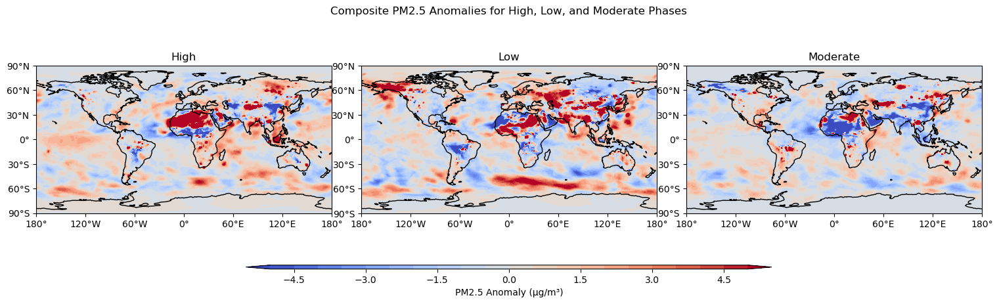

In [15]:
# Labels and contour levels for PM2.5 phases
labels = ['High', 'Low', 'Moderate']
clevs = np.arange(-5, 5.5, 0.5)  # Adjust based on PM2.5 anomaly range

# Prepare the composite maps for each phase
comp_pm25 = [positive_composite, negative_composite, neutral_composite]

# Define the figure with 1 row and 3 columns for the phases
fig, axs = plt.subplots(nrows=1, ncols=3,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(16, 5))

# Flatten axs to iterate over it easily
axs = axs.flatten()

# Loop over the phases and plot each
for i, pm25_phase in enumerate(comp_pm25):
    # Contour plot without add_cyclic_point
    cs = axs[i].contourf(pm25_phase['lon'], pm25_phase['lat'], pm25_phase, clevs,
                         transform=ccrs.PlateCarree(),
                         cmap='coolwarm', extend='both')  # Adjust cmap as needed

    # Longitude labels
    axs[i].set_xticks(np.arange(-180, 181, 60), crs=ccrs.PlateCarree())
    lon_formatter = cticker.LongitudeFormatter()
    axs[i].xaxis.set_major_formatter(lon_formatter)

    # Latitude labels
    axs[i].set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
    lat_formatter = cticker.LatitudeFormatter()
    axs[i].yaxis.set_major_formatter(lat_formatter)

    # Title each subplot with the phase name
    axs[i].set_title(labels[i])

    # Add coastlines to each subplot
    axs[i].coastlines()

# Adjust layout to fit colorbar
fig.subplots_adjust(bottom=0.25, top=0.9, left=0.05, right=0.95, wspace=0.1, hspace=0.5)

# Add a colorbar axis at the bottom
cbar_ax = fig.add_axes([0.25, 0.18, 0.5, 0.012])
cbar = fig.colorbar(cs, cax=cbar_ax, orientation='horizontal', label='PM2.5 Anomaly (µg/m³)')

# Add a title for the entire figure
plt.suptitle('Composite PM2.5 Anomalies for High, Low, and Moderate Phases')

plt.show()


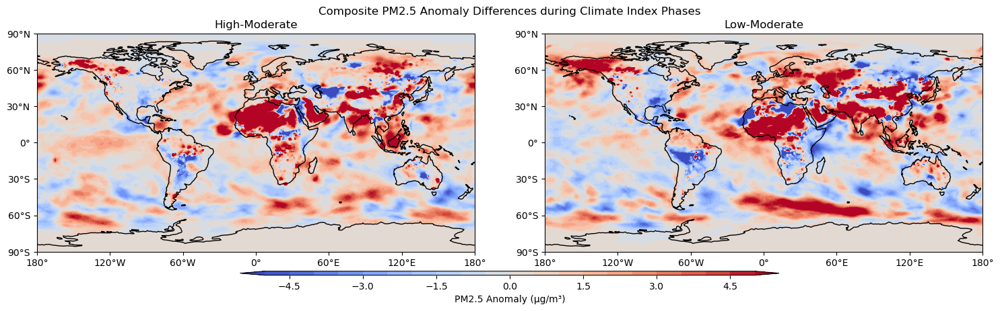

In [16]:
# Labels and contour levels for PM2.5 phases
labels = ['High-Moderate', 'Low-Moderate']
clevs = np.arange(-5, 5.5, 0.5)  # Adjust the range based on PM2.5 anomaly values

# Calculate the PM2.5 anomaly differences between each phase and neutral
diff_pm25 = [
    positive_composite - neutral_composite,
    negative_composite - neutral_composite
]

# Define the figure with one row and two columns
fig, axs = plt.subplots(nrows=1, ncols=2,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(16, 5))

# Flatten axs to iterate over it easily
axs = axs.flatten()

# Loop over the differences and plot each
for i, pm25_diff in enumerate(diff_pm25):
    # Contour plot without add_cyclic_point
    cs = axs[i].contourf(pm25_diff['lon'], pm25_diff['lat'], pm25_diff, clevs,
                         transform=ccrs.PlateCarree(),
                         cmap='coolwarm', extend='both')  # Adjust cmap as needed

    # Longitude labels
    axs[i].set_xticks(np.arange(-180, 181, 60), crs=ccrs.PlateCarree())
    lon_formatter = cticker.LongitudeFormatter()
    axs[i].xaxis.set_major_formatter(lon_formatter)

    # Latitude labels
    axs[i].set_yticks(np.arange(-90, 91, 30), crs=ccrs.PlateCarree())
    lat_formatter = cticker.LatitudeFormatter()
    axs[i].yaxis.set_major_formatter(lat_formatter)

    # Title each subplot
    axs[i].set_title(labels[i])

    # Add coastlines to each subplot
    axs[i].coastlines()

# Adjust layout to fit colorbar
fig.subplots_adjust(bottom=0.25, top=0.9, left=0.05, right=0.95, wspace=0.1, hspace=0.5)

# Add a colorbar axis at the bottom
cbar_ax = fig.add_axes([0.25, 0.18, 0.5, 0.012])
cbar = fig.colorbar(cs, cax=cbar_ax, orientation='horizontal', label='PM2.5 Anomaly (µg/m³)')

# Add a title for the entire figure
plt.suptitle('Composite PM2.5 Anomaly Differences during Climate Index Phases')

plt.show()


In [17]:
# Ensure there are no NaN values in positive_vals and neutral_vals
positive_vals = pm25_anomaly.sel(time=positive_periods).dropna(dim='time')
neutral_vals = pm25_anomaly.sel(time=neutral_periods).dropna(dim='time')

In [18]:
# Flatten the data to ensure they are 1D arrays for the t-test
positive_vals = positive_vals.values.flatten()
neutral_vals = neutral_vals.values.flatten()

# Remove any remaining NaNs from the flattened arrays
positive_vals = positive_vals[~np.isnan(positive_vals)]
neutral_vals = neutral_vals[~np.isnan(neutral_vals)]

# Perform the t-test if there are values in both arrays
if positive_vals.size > 0 and neutral_vals.size > 0:
    tstat, pval = stats.ttest_ind(positive_vals, neutral_vals, equal_var=False)
    
    # Mask data where p-value is above the significance threshold
    significance_level = 0.05
    significance_mask = (pval < significance_level)
else:
    print("Warning: One or both of the data arrays are empty after removing NaN values.")
    tstat, pval, significance_mask = None, None, None

# Now proceed with further analysis or visualization if tstat and pval are valid
if tstat is not None and pval is not None:
    print(f"T-statistic: {tstat}")
    print(f"P-value: {pval}")
else:
    print("T-test could not be performed due to insufficient data.")

T-statistic: 420.70813823727127
P-value: 0.0


# Interpretation of T-test Results Based on the Class Note:
In terms of the null hypothesis, a p-value of 0.0 indicates extremely strong evidence against the null hypothesis.
- **Null Hypothesis (H₀):** The difference between the means of the High and Moderate PM2.5 anomaly phases is zero (μₓ - μᵧ = 0).
- **Alternative Hypothesis (H₁):** There is a statistically significant difference between the means of the High and neutral phases (μₓ - μᵧ ≠ 0).

 Since the p-value is 0.0 (or effectively very close to zero), this suggests that there is almost no 
 chance that the observed difference between the means is due to random variation alone. This leads to 
 a **rejection of the null hypothesis** with high confidence.



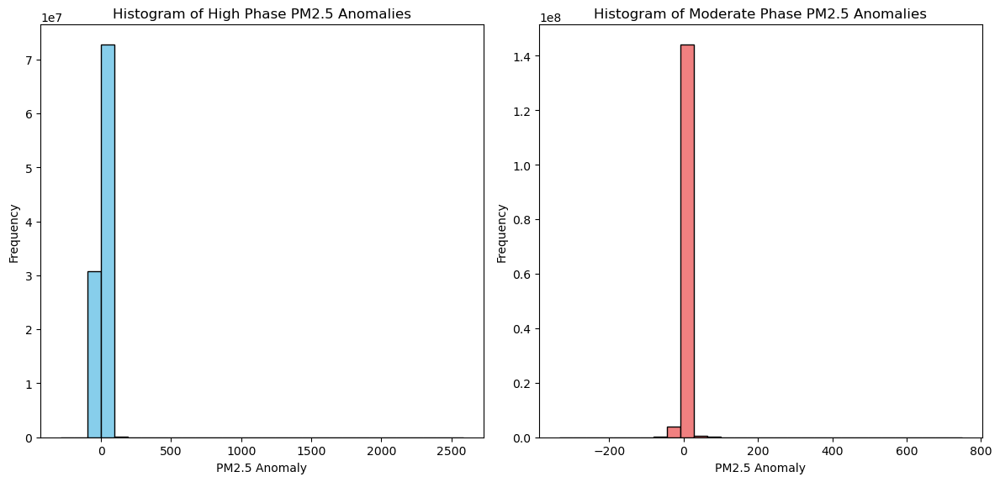

High Phase Summary Statistics:
Mean: 0.1435859650373459, Std Dev: 10.526869773864746, Min: -288.8183288574219, Max: 2585.4423828125

Moderate Phase Summary Statistics:
Mean: -0.3689649999141693, Std Dev: 7.868844509124756, Min: -333.9544982910156, Max: 748.7738037109375


In [27]:

# Plot histograms of the values in positive_vals and neutral_vals
plt.figure(figsize=(12, 6))

# Histogram for positive_vals
plt.subplot(1, 2, 1)
plt.hist(positive_vals, bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of High Phase PM2.5 Anomalies')
plt.xlabel('PM2.5 Anomaly')
plt.ylabel('Frequency')

# Histogram for neutral_vals
plt.subplot(1, 2, 2)
plt.hist(neutral_vals, bins=30, color='lightcoral', edgecolor='black')
plt.title('Histogram of Moderate Phase PM2.5 Anomalies')
plt.xlabel('PM2.5 Anomaly')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Print summary statistics for both
print("High Phase Summary Statistics:")
print(f"Mean: {np.mean(positive_vals)}, Std Dev: {np.std(positive_vals)}, Min: {np.min(positive_vals)}, Max: {np.max(positive_vals)}")

print("\nModerate Phase Summary Statistics:")
print(f"Mean: {np.mean(neutral_vals)}, Std Dev: {np.std(neutral_vals)}, Min: {np.min(neutral_vals)}, Max: {np.max(neutral_vals)}")


<p style="font-size:22px;">From the histogram figures, it appears that the PM2.5 anomaly data has extreme values and a high frequency near zero, which may indicate non-normality.</p>

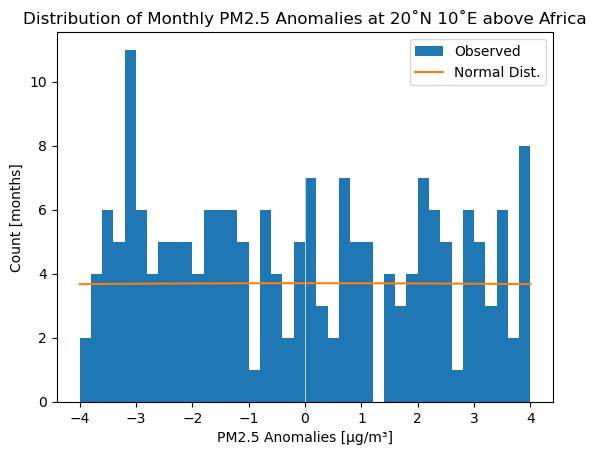

In [28]:
from scipy.stats import norm
import matplotlib.pyplot as plt
import numpy as np

# Specify the latitude and longitude for the regions above Africa 
lat, lon = 20, 10  # North Africa
# lat, lon = 30, 45  # Uncomment for Middle East

# Extract the anomalies at the nearest point to the specified latitude and longitude
grid_anoms = pm25_anomaly.sel(lat=lat, lon=lon, method='nearest')

# Define bin spacing and x values for histogram
spacing = 0.2
xvals = np.arange(-4, 4.1, spacing)

# Plot histogram of observed data
plt.hist(grid_anoms, bins=xvals, label="Observed")

# Overlay normal distribution curve for comparison
plt.plot(xvals, spacing * grid_anoms.count().data * norm.pdf(xvals, grid_anoms.mean(), grid_anoms.std()), label="Normal Dist.")
plt.legend()

# Add labels and title
plt.ylabel("Count [months]")
plt.xlabel("PM2.5 Anomalies [µg/m³]")
plt.axvline(0, color='w', linewidth=0.5)

# Format the location in the title
slon = f"{lon}˚E" if lon >= 0 else f"{-lon}˚W"
slat = f"{lat}˚N" if lat >= 0 else f"{-lat}˚S"
plt.title(f"Distribution of Monthly PM2.5 Anomalies at {slat} {slon} above Africa")

plt.show()


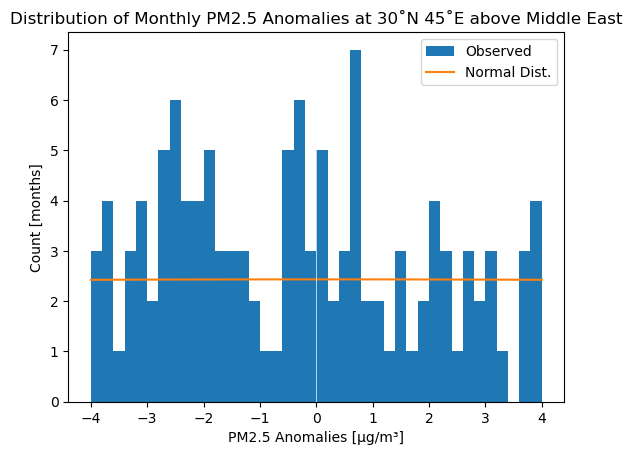

In [21]:
from scipy.stats import norm
import matplotlib.pyplot as plt
import numpy as np

# Specify the latitude and longitude for the regions the Middle East
lat, lon = 30, 45

# Extract the anomalies at the nearest point to the specified latitude and longitude
grid_anoms = pm25_anomaly.sel(lat=lat, lon=lon, method='nearest')

# Define bin spacing and x values for histogram
spacing = 0.2
xvals = np.arange(-4, 4.1, spacing)

# Plot histogram of observed data
plt.hist(grid_anoms, bins=xvals, label="Observed")

# Overlay normal distribution curve for comparison
plt.plot(xvals, spacing * grid_anoms.count().data * norm.pdf(xvals, grid_anoms.mean(), grid_anoms.std()), label="Normal Dist.")
plt.legend()

# Add labels and title
plt.ylabel("Count [months]")
plt.xlabel("PM2.5 Anomalies [µg/m³]")
plt.axvline(0, color='w', linewidth=0.5)

# Format the location in the title
slon = f"{lon}˚E" if lon >= 0 else f"{-lon}˚W"
slat = f"{lat}˚N" if lat >= 0 else f"{-lat}˚S"
plt.title(f"Distribution of Monthly PM2.5 Anomalies at {slat} {slon} above Middle East")

plt.show()


<p style="font-size:18px;">Other tests for Non-Normally Distributed Data</p>

In [19]:
# Define outlier thresholds based on percentiles
lower_threshold = np.percentile(positive_vals, 1)
upper_threshold = np.percentile(positive_vals, 99)

# Filter out the outliers
positive_vals_filtered = positive_vals[(positive_vals >= lower_threshold) & (positive_vals <= upper_threshold)]
neutral_vals_filtered = neutral_vals[(neutral_vals >= lower_threshold) & (neutral_vals <= upper_threshold)]

# Perform the t-test again
if positive_vals_filtered.size > 0 and neutral_vals_filtered.size > 0:
    tstat, pval = stats.ttest_ind(positive_vals_filtered, neutral_vals_filtered, equal_var=False)
    significance_mask = (pval < significance_level)
    print(f"T-statistic (filtered): {tstat}")
    print(f"P-value (filtered): {pval}")
else:
    print("Warning: One or both arrays are empty after outlier removal.")


T-statistic (filtered): 401.8438714107597
P-value (filtered): 0.0


In [31]:
from scipy.stats import mannwhitneyu

# Perform the Mann-Whitney U test
if positive_vals_filtered.size > 0 and neutral_vals_filtered.size > 0:
    u_stat, p_val = mannwhitneyu(positive_vals_filtered, neutral_vals_filtered, alternative='two-sided')
    print(f"U-statistic: {u_stat}")
    print(f"P-value (Mann-Whitney U test): {p_val}")
else:
    print("Warning: One or both arrays are empty after outlier removal.")


U-statistic: 7742494615579331.0
P-value (Mann-Whitney U test): 0.0


**Interpretation of Mann–Whitney U Test Results**
The result from the Mann–Whitney U test with a p-value of 0.0 suggests strong evidence against the Null Hypothesis (H₀).
The null hypothesis for the Mann–Whitney U test is that the distributions of PM2.5 anomalies for the high and moderate phases are identical, meaning that there is no statistically significant difference in the ranks of values between these two groups.
Because the p-value is 0.0, it indicates that there is an extremely low probability that the observed difference in the distributions is due to chance. This result leads to **rejecting the null hypothesis** with high confidence.


In [22]:
from scipy.stats import norm
import numpy as np

# Set the location and anomaly threshold for your data
lat, lon = 20, 45  # Example latitude and longitude for the region of interest
test_val = 2.0  # Example threshold for anomaly

# Select the grid anomalies at the nearest point to the specified latitude and longitude
#grid_anoms = pm25_anomaly.sel(lat=lat, lon=lon, method='nearest')

# Calculate probability based on normal distribution
norm_prob = norm.sf(test_val, grid_anoms.mean(), grid_anoms.std())

# Calculate probability based on actual data distribution
hist, bin_edges = np.histogram(grid_anoms, bins=100, density=True)
cumulative_prob = np.cumsum(hist * np.diff(bin_edges))

# Find the closest bin edge to `test_val`
closest_bin = np.argmin(abs(bin_edges - test_val)) - 1  # Adjust for cumulative_prob indexing
data_prob = 1.0 - cumulative_prob[closest_bin]

# Print probabilities
slon = f"{lon}˚E" if lon >= 0 else f"{-lon}˚W"
slat = f"{lat}˚N" if lat >= 0 else f"{-lat}˚S"

print(f"Probability of PM2.5 anomaly > {test_val} µg/m³ at {slat} {slon}:")
print(f"  Based on normal distribution: {100 * norm_prob:.2f}%")
print(f"  Based on actual data distribution: {100 * data_prob:.2f}%")

# Calculate the 99th percentile for the data
chance = 0.99
norm_value = norm.ppf(chance, grid_anoms.mean(), grid_anoms.std())
data_value = np.quantile(grid_anoms, chance)

# Print percentile information
print(f"\nPM2.5 anomaly corresponding to the {100 * chance:.0f}th percentile at {slat} {slon}:")
print(f"  Based on normal distribution: {norm_value:.2f} µg/m³")
print(f"  Based on actual data distribution: {data_value:.2f} µg/m³")


Probability of PM2.5 anomaly > 2.0 µg/m³ at 20˚N 45˚E:
  Based on normal distribution: 48.34%
  Based on actual data distribution: 30.05%

PM2.5 anomaly corresponding to the 99th percentile at 20˚N 45˚E:
  Based on normal distribution: 111.45 µg/m³
  Based on actual data distribution: 163.83 µg/m³


In [33]:
from scipy.stats import norm
import numpy as np

# Define regions and corresponding latitude and longitude
regions = {
    "Middle East": (30, 45),  # Example lat/lon for Middle East
    "Africa": (10, 20)        # Example lat/lon for Africa
}
test_val = 2.0  # Threshold for anomaly

for region, (lat, lon) in regions.items():
    # Select the grid anomalies at the nearest point to the specified latitude and longitude
    grid_anoms = pm25_anomaly.sel(lat=lat, lon=lon, method='nearest')  

    # Calculate probability based on normal distribution
    norm_prob = norm.sf(test_val, grid_anoms.mean(), grid_anoms.std())

    # Calculate probability based on actual data distribution
    hist, bin_edges = np.histogram(grid_anoms, bins=100, density=True)
    cumulative_prob = np.cumsum(hist * np.diff(bin_edges))
    
    # Find the closest bin edge to `test_val`
    closest_bin = np.argmin(abs(bin_edges - test_val)) - 1  # Adjust for cumulative_prob indexing
    data_prob = 1.0 - cumulative_prob[closest_bin] if closest_bin >= 0 else None

    # Prepare latitude/longitude strings for printing
    slon = f"{lon}˚E" if lon >= 0 else f"{-lon}˚W"
    slat = f"{lat}˚N" if lat >= 0 else f"{-lat}˚S"

    # Print probability results
    print(f"\nProbability of PM2.5 anomaly > {test_val} µg/m³ at {slat} {slon} ({region}):")
    print(f"  Based on normal distribution: {100 * norm_prob:.2f}%")
    if data_prob is not None:
        print(f"  Based on actual data distribution: {100 * data_prob:.2f}%")
    else:
        print("  Test value is out of the range of observed data distribution.")

    # Calculate the 99th percentile for the data
    chance = 0.99
    norm_value = norm.ppf(chance, grid_anoms.mean(), grid_anoms.std())
    data_value = np.quantile(grid_anoms, chance)

    # Print percentile information
    print(f"\nPM2.5 anomaly corresponding to the {100 * chance:.0f}th percentile at {slat} {slon} ({region}):")
    print(f"  Based on normal distribution: {norm_value:.2f} µg/m³")
    print(f"  Based on actual data distribution: {data_value:.2f} µg/m³")



Probability of PM2.5 anomaly > 2.0 µg/m³ at 30˚N 45˚E (Middle East):
  Based on normal distribution: 48.34%
  Based on actual data distribution: 30.05%

PM2.5 anomaly corresponding to the 99th percentile at 30˚N 45˚E (Middle East):
  Based on normal distribution: 111.45 µg/m³
  Based on actual data distribution: 163.83 µg/m³

Probability of PM2.5 anomaly > 2.0 µg/m³ at 10˚N 20˚E (Africa):
  Based on normal distribution: 45.72%
  Based on actual data distribution: 28.06%

PM2.5 anomaly corresponding to the 99th percentile at 10˚N 20˚E (Africa):
  Based on normal distribution: 43.26 µg/m³
  Based on actual data distribution: 78.25 µg/m³


**Interpretation:**
- **Discrepancies** between the normal distribution and the actual data distribution indicate that the PM2.5 anomaly data does not perfectly follow a normal distribution. This could be due to skewness, outliers, or other characteristics unique to PM2.5 concentrations.
- **Higher actual 99th percentile values** suggest that extreme PM2.5 events in these regions are more severe than a normal model would predict, which could have implications for air quality assessments and health impact predictions in these areas.

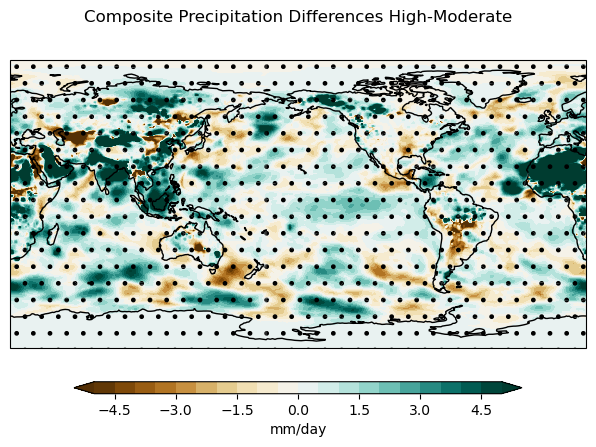

In [24]:
import numpy as np
import xarray as xr
from cartopy.util import add_cyclic_point
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Define evenly spaced longitude coordinates for interpolation
new_lon = np.linspace(-180, 180, len(diff_pm25[0]['lon'])) 

# Interpolate `diff_pm25[0]` onto the new longitude grid
diff_pm25_interp = diff_pm25[0].interp(lon=new_lon)

# Mask the interpolated data with the significance values
mask_diff = diff_pm25_interp.where(pval <= significance_level)

# Add cyclic points to interpolated data and mask
data_cyclic, lons_cyclic = add_cyclic_point(diff_pm25_interp, coord=new_lon)
mask_data_cyclic, lons_cyclic = add_cyclic_point(mask_diff, coord=new_lon)

# Plotting configuration
labels = ['High vs. Moderate']
clevs = np.arange(-5, 5.5, 0.5)  

# Create figure and axis with PlateCarree projection
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree(central_longitude=200.0)})

# Contour plot
cs = ax.contourf(lons_cyclic, diff_pm25_interp['lat'], data_cyclic, clevs,
                 transform=ccrs.PlateCarree(), cmap='BrBG', extend='both')

# Overlay stippling for significance mask
ss = ax.contourf(lons_cyclic, diff_pm25_interp['lat'], mask_data_cyclic, [0, 1],
                 transform=ccrs.PlateCarree(), colors=['none'], hatches=['.'], extend='both', alpha=0.0)

# Add coastlines
ax.coastlines()

# Adjust layout to make room for colorbar
fig.subplots_adjust(bottom=0.25, top=0.9, left=0.05, right=0.95)

# Add colorbar below plot
cbar_ax = fig.add_axes([0.15, 0.18, 0.7, 0.025])
cbar = fig.colorbar(cs, cax=cbar_ax, orientation='horizontal', label='mm/day')

# Set plot title
plt.suptitle('Composite Precipitation Differences High-Moderate')

# Save plot to file
plt.savefig('stats_ttest.png')
plt.show()


The Composite Precipitation Differences High-Moderate plot shows the composite differences between High and Moderate phases with stippling to indicate areas of statistical significance, which aligns with the approach demonstrated in the notebook. The color bar and stippling indicate regions with notable differences, which is consistent with the statistical significance visualization techniques covered in the notebook.